# Train a Two-Stage Detector (Faster R-CNN) on a Roboflow COCO Dataset

This notebook fine-tunes a **Faster R-CNN** object detector on a Roboflow dataset
exported in **COCO** format. Everything is driven from a single `CONFIG` block, so
the same notebook runs on any project by changing a few values, with no other edits.

**Workflow**

1. Install dependencies
2. Import libraries
3. Configuration and reproducibility (single place to change settings)
4. Download the dataset from Roboflow
5. Read class names and training class counts automatically
6. Dataset split overview (per-split, per-class box counts)
7. Display sample annotated images with `supervision`
8. Build the PyTorch COCO dataset and DataLoaders
9. Create the Faster R-CNN model
10. Train, logging losses and validation mAP each epoch
11. Evaluate: loss curves, metric curves, per-class AP vs training data
12. Run prediction on a test image and compare against ground truth
13. Save a self-contained checkpoint

**Security note:** never hardcode your Roboflow API key. Use Colab Secrets
(`ROBOFLOW_API_KEY`) or enter it when prompted with `getpass`.

## 1. Install Required Libraries

Roboflow for the dataset, Supervision for visualization, Torch/TorchVision for Faster R-CNN, TorchMetrics for detection metrics, and TensorBoard for logging.

In [1]:

!pip -q install roboflow supervision pycocotools torchmetrics tensorboard


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.3/260.3 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 kB 15.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 91.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 7.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
httpx2 2.4.0 requires idna>=3.18, but you have idna 3.7 which is incompatible.


## 2. Import Libraries

In [2]:

import os
import json
import random
from pathlib import Path
from collections import Counter

import cv2
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from tqdm.auto import tqdm
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms.functional as F

from pycocotools.coco import COCO
from torchmetrics.detection.mean_ap import MeanAveragePrecision

import supervision as sv


## 3. Configuration and Reproducibility

Every setting the notebook uses lives here. To run on a different Roboflow project, change `workspace`, `project`, and `version`. Training and inference settings are grouped below. Seeds are fixed for reproducible runs, and the environment is printed for traceability.

In [3]:
# ----------------------------------------------------------------------
# Central configuration. Change values here to run on a different Roboflow
# project or with different training settings. No other cell needs editing.
# ----------------------------------------------------------------------
CONFIG = {
    # Roboflow project
    "workspace": "tim-4ijf0",
    "project": "surgical-tools-yotlv-nvvoh",
    "version": 2,
    "export_format": "coco",

    # Training
    "num_epochs": 10,
    "batch_size": 2,
    "num_workers": 2,
    "learning_rate": 0.005,
    "momentum": 0.9,
    "weight_decay": 0.0005,
    "lr_step_size": 3,
    "lr_gamma": 0.1,
    "eval_every": 1,

    # Inference and matching
    "score_threshold": 0.5,
    "iou_threshold": 0.5,

    # A class with fewer training boxes than this is flagged as data-limited
    "min_recommended_boxes": 30,

    # Reproducibility
    "seed": 42,
}


def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed(CONFIG["seed"])

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

print("Environment")
print("-----------")
print("PyTorch:       ", torch.__version__)
print("TorchVision:   ", torchvision.__version__)
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:           ", torch.cuda.get_device_name(0))
print("Device:        ", device)
print("Seed:          ", CONFIG["seed"])

Environment
-----------
PyTorch:        2.11.0+cu128
TorchVision:    0.26.0+cu128
CUDA available: True
GPU:            Tesla T4
Device:         cuda
Seed:           42


## 4. Download the Dataset from Roboflow

Downloads the configured project version in COCO format. The printed version number is your provenance: if class counts later disagree with the Roboflow dashboard, confirm you are looking at this same version.

In [4]:
from getpass import getpass

try:
    from google.colab import userdata
    ROBOFLOW_API_KEY = userdata.get("ROBOFLOW_API_KEY")
except Exception:
    ROBOFLOW_API_KEY = None

if not ROBOFLOW_API_KEY:
    ROBOFLOW_API_KEY = getpass("Enter Roboflow API key: ")

from roboflow import Roboflow

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace(CONFIG["workspace"]).project(CONFIG["project"])
version = project.version(CONFIG["version"])

dataset = version.download(CONFIG["export_format"])
DATASET_DIR = Path(dataset.location)

print("Workspace:    ", CONFIG["workspace"])
print("Project:      ", CONFIG["project"])
print("Version:      ", CONFIG["version"])
print("Downloaded to:", DATASET_DIR)
print("Splits found: ", [p.name for p in DATASET_DIR.iterdir() if p.is_dir()])

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Surgical-Tools-2 in coco:: 100%|██████████| 514/514 [00:00<00:00, 8378.53it/s]

Workspace:     tim-4ijf0
Project:       surgical-tools-yotlv-nvvoh
Version:       2
Downloaded to: /content/Surgical-Tools-2
Splits found:  ['valid', 'train', 'test']


## 5. Read Class Names and Class Counts

Read the training annotations, drop any empty placeholder category, and build one canonical label mapping shared by every split.

In [5]:

TRAIN_ANN = DATASET_DIR / "train" / "_annotations.coco.json"
VALID_ANN = DATASET_DIR / "valid" / "_annotations.coco.json"
TEST_ANN = DATASET_DIR / "test" / "_annotations.coco.json"

with open(TRAIN_ANN, "r") as f:
    train_coco_json = json.load(f)

# Count how many annotations reference each category id in the training set.
annotations_per_cat_id = Counter(
    ann["category_id"] for ann in train_coco_json["annotations"]
)

# Keep only categories that actually have annotations. Some COCO exports
# (including many from Roboflow) add a placeholder supercategory that has zero
# boxes. Dropping empty categories removes it automatically. On a clean dataset
# where every category has boxes, all categories are kept, so this is a no-op
# and the same code works unchanged on any dataset.
kept_categories = [
    cat for cat in train_coco_json["categories"]
    if annotations_per_cat_id.get(cat["id"], 0) > 0
]

# Canonical label mapping, built once and shared by every split and every later
# cell. Contiguous ids start at 1 because Faster R-CNN reserves 0 for the
# background class.
cat_id_to_contiguous = {
    cat["id"]: idx + 1 for idx, cat in enumerate(kept_categories)
}
contiguous_to_name = {
    idx + 1: cat["name"] for idx, cat in enumerate(kept_categories)
}

cat_id_to_name = {cat["id"]: cat["name"] for cat in kept_categories}
class_names = [cat["name"] for cat in kept_categories]

# Faster R-CNN needs background class also
num_classes = len(class_names) + 1

class_counter = Counter()
for ann in train_coco_json["annotations"]:
    cat_id = ann["category_id"]
    if cat_id in cat_id_to_name:
        class_counter[cat_id_to_name[cat_id]] += 1

class_count_df = pd.DataFrame({
    "class_name": list(class_counter.keys()),
    "object_count": list(class_counter.values())
}).sort_values("object_count", ascending=False)

print("Number of object classes:", len(class_names))
print("Number of model classes including background:", num_classes)
print("Class names:", class_names)
display(class_count_df)


Number of object classes: 10
Number of model classes including background: 11
Class names: ['BP Handle', 'Babcock Tissue Forceps', 'Curved Mayo Scissors', 'Curved Needle holder', 'Dressing Scissors', 'Mayo Metzenbum Scissors', 'Mayo Needle Holder', 'Non-Toothed Dissector', 'Right-Angled Needle Holder', 'Toothed Dissector']


,class_name,object_count
3,Dressing Scissors,125
0,Mayo Needle Holder,103
1,Curved Needle holder,101
6,BP Handle,75
2,Babcock Tissue Forceps,58
5,Mayo Metzenbum Scissors,45
4,Non-Toothed Dissector,40
7,Toothed Dissector,30
9,Right-Angled Needle Holder,21
8,Curved Mayo Scissors,7


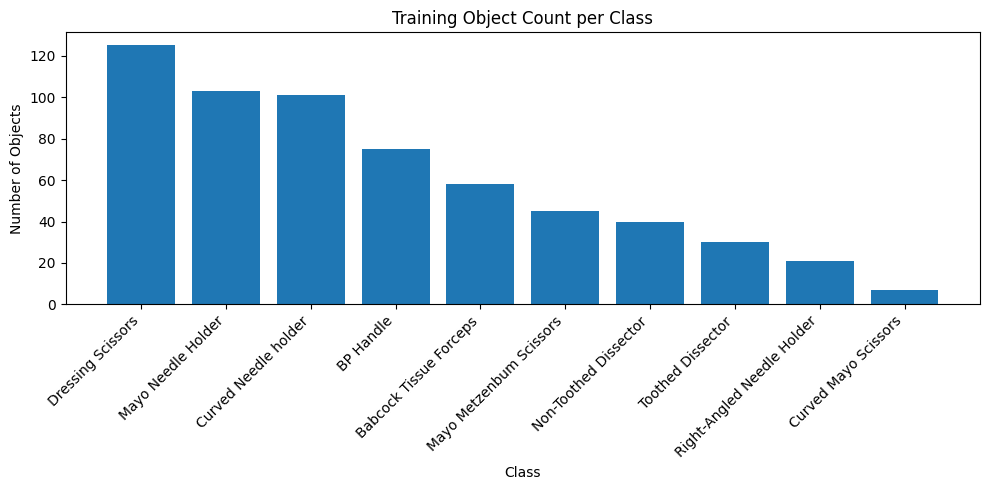

In [6]:

plt.figure(figsize=(10, 5))
plt.bar(class_count_df["class_name"], class_count_df["object_count"])
plt.xticks(rotation=45, ha="right")
plt.title("Training Object Count per Class")
plt.xlabel("Class")
plt.ylabel("Number of Objects")
plt.tight_layout()
plt.show()


## 6. Dataset Split Overview

Per-split, per-class box counts read directly from the exported COCO files. This is exactly what the model sees. If it disagrees with the Roboflow dashboard, you are almost certainly comparing against a different dataset version.

In [7]:
# Per-split, per-class annotation counts taken straight from the exported COCO
# files, so they reflect precisely what the model trains and validates on.
split_files = {
    "train": TRAIN_ANN,
    "valid": VALID_ANN,
    "test": TEST_ANN,
}

overview_rows = {}
split_image_counts = {}
split_box_counts = {}

for split, ann_path in split_files.items():
    if not Path(ann_path).exists():
        continue
    data = json.load(open(ann_path))
    id_to_name = {c["id"]: c["name"] for c in data["categories"]}
    split_image_counts[split] = len(data["images"])
    split_box_counts[split] = len(data["annotations"])
    counts = Counter(
        id_to_name[a["category_id"]]
        for a in data["annotations"]
        if a["category_id"] in id_to_name
    )
    for name in class_names:
        overview_rows.setdefault(name, {})[split] = counts.get(name, 0)

overview_df = pd.DataFrame(overview_rows).T
for split in ["train", "valid", "test"]:
    if split not in overview_df.columns:
        overview_df[split] = 0
overview_df = overview_df[["train", "valid", "test"]]
overview_df["total"] = overview_df.sum(axis=1)
overview_df = overview_df.sort_values("train", ascending=False)

print("Images per split:", split_image_counts)
print("Boxes per split: ", split_box_counts)
print("Total classes:   ", len(class_names))
print()
display(overview_df)

low = overview_df[overview_df["train"] < CONFIG["min_recommended_boxes"]]
if len(low) > 0:
    names = ", ".join(low.index)
    print(f"{len(low)} class(es) below {CONFIG['min_recommended_boxes']} training boxes: {names}")
    print("Expect weak per-class AP for these. That is a data-volume limit, not a code issue.")

Images per split: {'train': 356, 'valid': 102, 'test': 51}
Boxes per split:  {'train': 605, 'valid': 223, 'test': 94}
Total classes:    10



,train,valid,test,total
Dressing Scissors,125,54,13,192
Mayo Needle Holder,103,36,23,162
Curved Needle holder,101,29,19,149
BP Handle,75,22,10,107
Babcock Tissue Forceps,58,21,11,90
Mayo Metzenbum Scissors,45,23,5,73
Non-Toothed Dissector,40,21,4,65
Toothed Dissector,30,8,6,44
Right-Angled Needle Holder,21,9,3,33
Curved Mayo Scissors,7,0,0,7


2 class(es) below 30 training boxes: Right-Angled Needle Holder, Curved Mayo Scissors
Expect weak per-class AP for these. That is a data-volume limit, not a code issue.


## 7. Display Sample Annotated Images

Draw ground-truth boxes and labels on a few random training images using `supervision`.

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


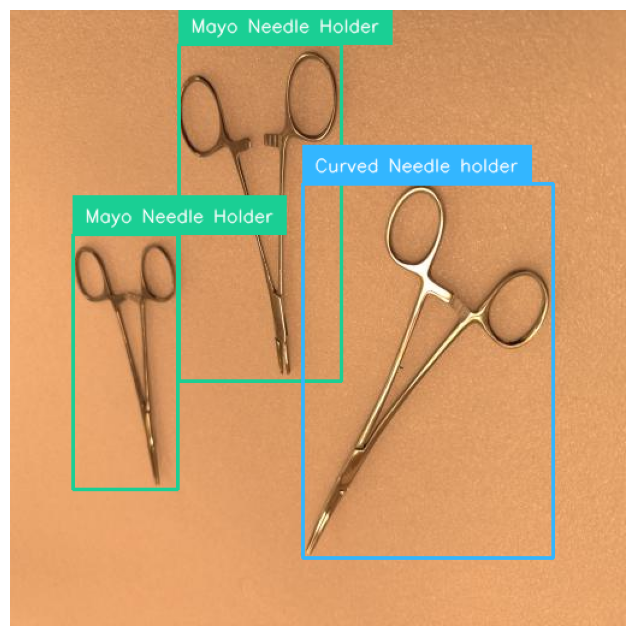

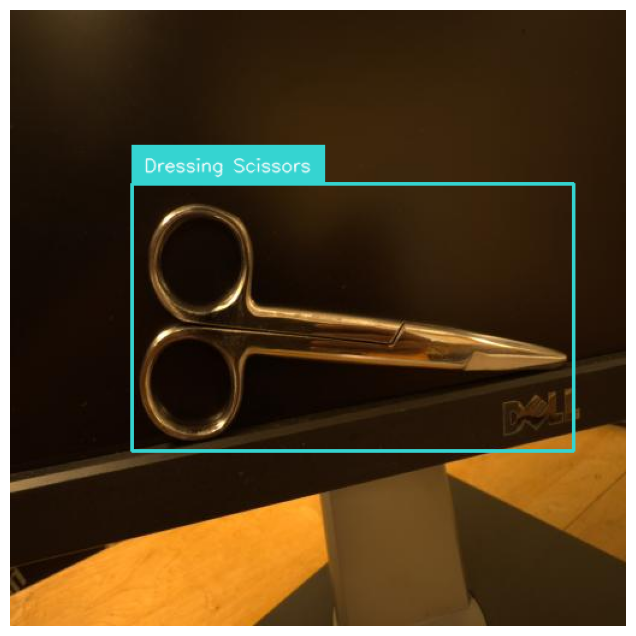

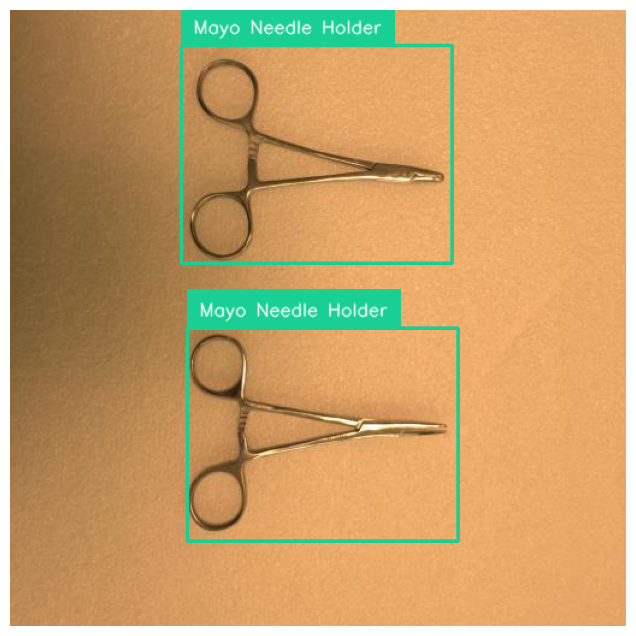

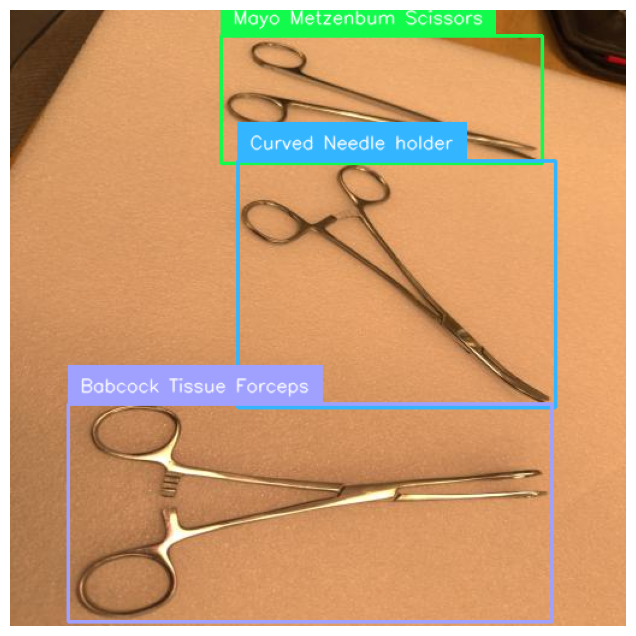

In [8]:

def get_supervision_annotators():
    # Supports both newer and older supervision versions.
    if hasattr(sv, "BoxAnnotator"):
        box_annotator = sv.BoxAnnotator()
    else:
        box_annotator = sv.BoundingBoxAnnotator()

    label_annotator = sv.LabelAnnotator() if hasattr(sv, "LabelAnnotator") else None
    return box_annotator, label_annotator


def annotate_with_supervision(image, detections, labels):
    box_annotator, label_annotator = get_supervision_annotators()

    try:
        annotated = box_annotator.annotate(
            scene=image.copy(),
            detections=detections
        )
        if label_annotator is not None:
            annotated = label_annotator.annotate(
                scene=annotated,
                detections=detections,
                labels=labels
            )
        else:
            # Older supervision versions accepted labels directly in BoxAnnotator
            annotated = box_annotator.annotate(
                scene=image.copy(),
                detections=detections,
                labels=labels
            )
    except TypeError:
        # Fallback for older API
        annotated = box_annotator.annotate(
            scene=image.copy(),
            detections=detections,
            labels=labels
        )

    return annotated


def load_coco_sample(coco, image_dir, image_id):
    img_info = coco.loadImgs(image_id)[0]
    img_path = image_dir / img_info["file_name"]

    image = cv2.imread(str(img_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=image_id)
    anns = coco.loadAnns(ann_ids)

    boxes = []
    class_ids = []
    labels = []

    for ann in anns:
        x, y, w, h = ann["bbox"]
        if w <= 0 or h <= 0:
            continue

        boxes.append([x, y, x + w, y + h])
        class_ids.append(ann["category_id"])
        labels.append(cat_id_to_name[ann["category_id"]])

    if len(boxes) == 0:
        detections = sv.Detections.empty()
    else:
        detections = sv.Detections(
            xyxy=np.array(boxes, dtype=np.float32),
            class_id=np.array(class_ids, dtype=int)
        )

    return image, detections, labels


train_coco = COCO(str(TRAIN_ANN))
train_image_dir = DATASET_DIR / "train"

sample_ids = random.sample(train_coco.getImgIds(), k=min(4, len(train_coco.getImgIds())))

for image_id in sample_ids:
    image, detections, labels = load_coco_sample(train_coco, train_image_dir, image_id)
    annotated = annotate_with_supervision(image, detections, labels)

    plt.figure(figsize=(8, 8))
    plt.imshow(annotated)
    plt.axis("off")
    plt.show()


## 8. Build the PyTorch COCO Dataset and DataLoaders

TorchVision Faster R-CNN expects each image with a target dict of boxes and labels. COCO boxes are `[x, y, w, h]`, so we convert to `[x1, y1, x2, y2]`.

In [9]:
class RoboflowCocoDetectionDataset(Dataset):
    def __init__(self, image_dir, annotation_file, cat_id_to_contiguous,
                 contiguous_to_name, filter_empty=False):
        self.image_dir = Path(image_dir)
        self.coco = COCO(str(annotation_file))

        # Use the shared canonical mapping built once from the training set so
        # that train, valid and test all produce identical labels, and any
        # placeholder or empty category stays out of the label space.
        self.cat_id_to_contiguous = cat_id_to_contiguous
        self.contiguous_to_name = contiguous_to_name

        all_image_ids = self.coco.getImgIds()

        if filter_empty:
            self.image_ids = []
            for image_id in all_image_ids:
                ann_ids = self.coco.getAnnIds(imgIds=image_id)
                anns = self.coco.loadAnns(ann_ids)

                valid_boxes = [
                    ann for ann in anns
                    if ann["bbox"][2] > 0 and ann["bbox"][3] > 0
                    and ann["category_id"] in self.cat_id_to_contiguous
                ]

                if len(valid_boxes) > 0:
                    self.image_ids.append(image_id)
        else:
            self.image_ids = all_image_ids

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image_info = self.coco.loadImgs(image_id)[0]
        image_path = self.image_dir / image_info["file_name"]

        image = Image.open(image_path).convert("RGB")
        image = F.to_tensor(image)

        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)

        boxes = []
        labels = []
        area = []
        iscrowd = []

        for ann in anns:
            x, y, w, h = ann["bbox"]

            if w <= 0 or h <= 0:
                continue

            # Skip annotations whose category is not in the canonical mapping
            # (for example a placeholder category). This keeps the dataset from
            # crashing on any dataset, whether it has empty categories or not.
            if ann["category_id"] not in self.cat_id_to_contiguous:
                continue

            boxes.append([x, y, x + w, y + h])
            labels.append(self.cat_id_to_contiguous[ann["category_id"]])
            area.append(ann.get("area", w * h))
            iscrowd.append(ann.get("iscrowd", 0))

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            area = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            area = torch.as_tensor(area, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id]),
            "area": area,
            "iscrowd": iscrowd
        }

        return image, target

In [10]:
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = RoboflowCocoDetectionDataset(
    image_dir=DATASET_DIR / "train",
    annotation_file=TRAIN_ANN,
    cat_id_to_contiguous=cat_id_to_contiguous,
    contiguous_to_name=contiguous_to_name,
    filter_empty=True
)

valid_dataset = RoboflowCocoDetectionDataset(
    image_dir=DATASET_DIR / "valid",
    annotation_file=VALID_ANN,
    cat_id_to_contiguous=cat_id_to_contiguous,
    contiguous_to_name=contiguous_to_name,
    filter_empty=False
)

train_loader = DataLoader(
    train_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=True,
    num_workers=CONFIG["num_workers"],
    collate_fn=collate_fn
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=CONFIG["batch_size"],
    shuffle=False,
    num_workers=CONFIG["num_workers"],
    collate_fn=collate_fn
)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [11]:
print("Training images after filtering:", len(train_dataset))
print("Validation images:", len(valid_dataset))

Training images after filtering: 352
Validation images: 102


## 9. Create the Faster R-CNN Model

Start from `fasterrcnn_resnet50_fpn` pretrained on COCO and replace the box predictor head to match our class count.

In [12]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

# Replace the classification head for our custom number of classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 212MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [13]:
# Model summary
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("Model:                Faster R-CNN (ResNet-50 FPN)")
print("Backbone weights:     pretrained on COCO")
print("Detection classes:   ", len(class_names), "(plus background)")
print(f"Total parameters:     {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Model:                Faster R-CNN (ResNet-50 FPN)
Backbone weights:     pretrained on COCO
Detection classes:    10 (plus background)
Total parameters:     41,345,286
Trainable parameters: 41,122,886


## 10. Train the Model

Standard TorchVision detection fine-tuning: SGD with momentum, a step LR schedule, per-epoch validation mAP, and TensorBoard logging. Adjust `num_epochs` and learning rate in `CONFIG`.

In [14]:
optimizer = torch.optim.SGD(
    model.parameters(),
    lr=CONFIG["learning_rate"],
    momentum=CONFIG["momentum"],
    weight_decay=CONFIG["weight_decay"]
)

lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=CONFIG["lr_step_size"],
    gamma=CONFIG["lr_gamma"]
)

def evaluate_model_map(model, data_loader, device, max_batches=None):
    metric = MeanAveragePrecision(
        box_format="xyxy",
        class_metrics=True
    )

    model.eval()

    with torch.no_grad():
        for batch_idx, (images, targets) in enumerate(data_loader):
            if max_batches is not None and batch_idx >= max_batches:
                break

            images = [img.to(device) for img in images]
            outputs = model(images)

            preds = []
            gt_targets = []

            for output in outputs:
                preds.append({
                    "boxes": output["boxes"].detach().cpu(),
                    "scores": output["scores"].detach().cpu(),
                    "labels": output["labels"].detach().cpu()
                })

            for target in targets:
                gt_targets.append({
                    "boxes": target["boxes"].detach().cpu(),
                    "labels": target["labels"].detach().cpu()
                })

            metric.update(preds, gt_targets)

    results = metric.compute()
    return results

writer = SummaryWriter(f"runs/{CONFIG['project']}")

NUM_EPOCHS = CONFIG["num_epochs"]
EVAL_EVERY = CONFIG["eval_every"]

history = []

loss_keys = [
    "loss_classifier",
    "loss_box_reg",
    "loss_objectness",
    "loss_rpn_box_reg"
]

for epoch in range(NUM_EPOCHS):
    model.train()

    running_losses = {
        "total_loss": 0.0,
        "loss_classifier": 0.0,
        "loss_box_reg": 0.0,
        "loss_objectness": 0.0,
        "loss_rpn_box_reg": 0.0
    }

    progress_bar = tqdm(
        train_loader,
        desc=f"Epoch {epoch + 1}/{NUM_EPOCHS}"
    )

    for images, targets in progress_bar:
        images = [img.to(device) for img in images]

        targets = [
            {k: v.to(device) for k, v in target.items()}
            for target in targets
        ]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        running_losses["total_loss"] += losses.item()

        for key in loss_keys:
            if key in loss_dict:
                running_losses[key] += loss_dict[key].item()

        progress_bar.set_postfix({
            "loss": f"{losses.item():.4f}"
        })

    lr_scheduler.step()

    num_batches = len(train_loader)

    epoch_result = {
        "epoch": epoch + 1
    }

    for key, value in running_losses.items():
        avg_value = value / num_batches
        epoch_result[key] = avg_value
        writer.add_scalar(f"train/{key}", avg_value, epoch + 1)

    if (epoch + 1) % EVAL_EVERY == 0:
        val_results = evaluate_model_map(
            model=model,
            data_loader=valid_loader,
            device=device
        )

        epoch_result["map"] = float(val_results["map"])
        epoch_result["map_50"] = float(val_results["map_50"])
        epoch_result["map_75"] = float(val_results["map_75"])
        epoch_result["mar_100"] = float(val_results["mar_100"])

        writer.add_scalar("val/mAP", epoch_result["map"], epoch + 1)
        writer.add_scalar("val/mAP_50", epoch_result["map_50"], epoch + 1)
        writer.add_scalar("val/mAP_75", epoch_result["map_75"], epoch + 1)
        writer.add_scalar("val/mAR_100", epoch_result["mar_100"], epoch + 1)

    history.append(epoch_result)

    # Column-wise epoch summary: header printed every epoch, wide columns.
    summary = {
        "Epoch": epoch + 1,
        "TotalLoss": epoch_result["total_loss"],
        "ClsLoss": epoch_result["loss_classifier"],
        "BoxReg": epoch_result["loss_box_reg"],
        "Objectness": epoch_result["loss_objectness"],
        "RPNBoxReg": epoch_result["loss_rpn_box_reg"],
        "mAP": epoch_result.get("map"),
        "mAP@50": epoch_result.get("map_50"),
        "mAP@75": epoch_result.get("map_75"),
        "mAR@100": epoch_result.get("mar_100"),
    }

    W = 13

    def _fmt(v):
        if v is None:
            return "-"
        if isinstance(v, int):
            return str(v)
        return f"{v:.4f}"

    header = "".join(f"{name:>{W}}" for name in summary)
    print()
    print(header)
    print("-" * len(header))
    print("".join(f"{_fmt(v):>{W}}" for v in summary.values()))

writer.close()

Epoch 1/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            1       0.3658       0.1970       0.1543       0.0031       0.0115       0.2273       0.4026       0.2489       0.5495


Epoch 2/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            2       0.2252       0.1323       0.0819       0.0017       0.0093       0.3757       0.5727       0.4573       0.6421


Epoch 3/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            3       0.1806       0.0994       0.0729       0.0016       0.0067       0.4229       0.6593       0.5201       0.6516


Epoch 4/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            4       0.1294       0.0742       0.0497       0.0011       0.0044       0.5414       0.7062       0.6256       0.7588


Epoch 5/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            5       0.1068       0.0625       0.0403       0.0009       0.0031       0.5528       0.7206       0.6593       0.7696


Epoch 6/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            6       0.0975       0.0561       0.0376       0.0009       0.0028       0.5646       0.7329       0.6710       0.7696


Epoch 7/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            7       0.0900       0.0522       0.0345       0.0007       0.0026       0.5718       0.7315       0.6700       0.7724


Epoch 8/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            8       0.0888       0.0514       0.0339       0.0009       0.0025       0.5775       0.7406       0.6804       0.7745


Epoch 9/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
            9       0.0879       0.0509       0.0337       0.0009       0.0025       0.5781       0.7416       0.6816       0.7720


Epoch 10/10:   0%|          | 0/176 [00:00<?, ?it/s]


        Epoch    TotalLoss      ClsLoss       BoxReg   Objectness    RPNBoxReg          mAP       mAP@50       mAP@75      mAR@100
----------------------------------------------------------------------------------------------------------------------------------
           10       0.0866       0.0501       0.0333       0.0007       0.0025       0.5780       0.7421       0.6826       0.7705


## 11. Evaluate Model Performance

Inspect the full training history, best epoch, loss and metric curves, and per-class AP alongside training-box counts.

In [15]:
history_df = pd.DataFrame(history)
display(history_df)

,epoch,total_loss,loss_classifier,loss_box_reg,loss_objectness,loss_rpn_box_reg,map,map_50,map_75,mar_100
0,1,0.365829,0.196990,0.154283,0.003069,0.011487,0.227294,0.402560,0.248905,0.549528
1,2,0.225207,0.132269,0.081915,0.001684,0.009340,0.375685,0.572740,0.457337,0.642069
2,3,0.180574,0.099370,0.072904,0.001555,0.006745,0.422850,0.659321,0.520104,0.651565
3,4,0.129435,0.074180,0.049729,0.001101,0.004425,0.541351,0.706183,0.625558,0.758834
4,5,0.106836,0.062508,0.040281,0.000911,0.003135,0.552758,0.720586,0.659341,0.769572
5,6,0.097468,0.056110,0.037620,0.000905,0.002833,0.564617,0.732860,0.671025,0.769595
6,7,0.089994,0.052198,0.034508,0.000716,0.002573,0.571849,0.731459,0.669960,0.772356
7,8,0.088772,0.051424,0.033946,0.000869,0.002532,0.577455,0.740599,0.680399,0.774521
8,9,0.087890,0.050851,0.033651,0.000878,0.002510,0.578139,0.741632,0.681575,0.772026
9,10,0.086575,0.050098,0.033334,0.000657,0.002486,0.577969,0.742109,0.682638,0.770511


In [16]:
# Best epoch by validation mAP and a compact final summary.
if "map" in history_df.columns and history_df["map"].notna().any():
    best = history_df.loc[history_df["map"].idxmax()]
    last = history_df.iloc[-1]
    print("Training summary")
    print("----------------")
    print(f"Epochs run:       {len(history_df)}")
    print(f"Best epoch (mAP): {int(best['epoch'])}")
    print(f"  mAP:     {best['map']:.4f}")
    print(f"  mAP@50:  {best['map_50']:.4f}")
    print(f"  mAP@75:  {best['map_75']:.4f}")
    print(f"  mAR@100: {best['mar_100']:.4f}")
    print(f"Final total loss: {last['total_loss']:.4f}")
else:
    print("No validation metrics were recorded.")

Training summary
----------------
Epochs run:       10
Best epoch (mAP): 9
  mAP:     0.5781
  mAP@50:  0.7416
  mAP@75:  0.6816
  mAR@100: 0.7720
Final total loss: 0.0866


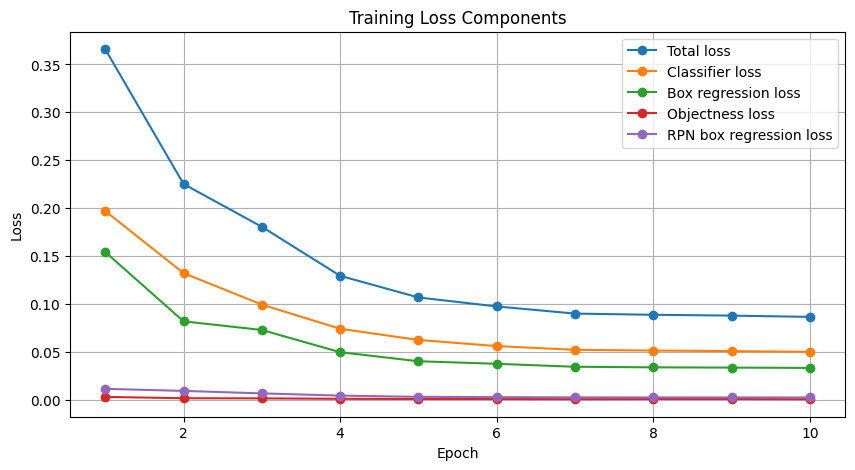

In [17]:
plt.figure(figsize=(10, 5))

plt.plot(history_df["epoch"], history_df["total_loss"], marker="o", label="Total loss")
plt.plot(history_df["epoch"], history_df["loss_classifier"], marker="o", label="Classifier loss")
plt.plot(history_df["epoch"], history_df["loss_box_reg"], marker="o", label="Box regression loss")
plt.plot(history_df["epoch"], history_df["loss_objectness"], marker="o", label="Objectness loss")
plt.plot(history_df["epoch"], history_df["loss_rpn_box_reg"], marker="o", label="RPN box regression loss")

plt.title("Training Loss Components")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

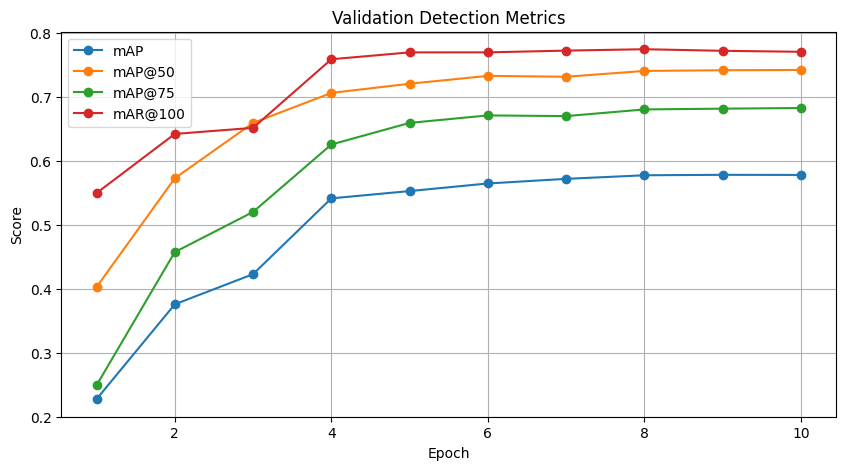

In [18]:
plt.figure(figsize=(10, 5))

plt.plot(history_df["epoch"], history_df["map"], marker="o", label="mAP")
plt.plot(history_df["epoch"], history_df["map_50"], marker="o", label="mAP@50")
plt.plot(history_df["epoch"], history_df["map_75"], marker="o", label="mAP@75")
plt.plot(history_df["epoch"], history_df["mar_100"], marker="o", label="mAR@100")

plt.title("Validation Detection Metrics")
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.show()

### Per-Class AP vs Training Data

Per-class average precision on the validation set, joined with each class's training-box count. Low AP next to a low count points at data volume rather than the model. AP of -1 means the class had no validation examples to score.

In [19]:
final_results = evaluate_model_map(
    model=model,
    data_loader=valid_loader,
    device=device
)

if "map_per_class" in final_results and final_results["map_per_class"].numel() > 0:
    map_per_class = final_results["map_per_class"].reshape(-1)
    mar_per_class = final_results.get("mar_100_per_class", None)
    if mar_per_class is not None:
        mar_per_class = mar_per_class.reshape(-1)

    classes = final_results.get(
        "classes",
        torch.arange(1, len(map_per_class) + 1)
    ).reshape(-1)

    rows = []
    for i, class_id in enumerate(classes):
        class_id = int(class_id)
        name = train_dataset.contiguous_to_name.get(class_id, f"class_{class_id}")

        row = {
            "class_name": name,
            "train_boxes": int(overview_df.loc[name, "train"]) if name in overview_df.index else None,
            "AP": round(float(map_per_class[i]), 4),
        }
        if mar_per_class is not None:
            row["AR@100"] = round(float(mar_per_class[i]), 4)
        rows.append(row)

    per_class_df = pd.DataFrame(rows).sort_values("AP", ascending=False)
    display(per_class_df)

    missing = per_class_df[per_class_df["AP"] < 0]
    if len(missing) > 0:
        names = ", ".join(missing["class_name"])
        print(f"AP = -1 (no validation examples) for: {names}")
else:
    print("Per-class mAP is not available for this run.")

,class_name,train_boxes,AP,AR@100
3,Dressing Scissors,125,0.8014,0.8444
7,Right-Angled Needle Holder,21,0.7346,0.8444
2,Curved Needle holder,101,0.7163,0.8517
5,Mayo Needle Holder,103,0.6787,0.8361
4,Mayo Metzenbum Scissors,45,0.6045,0.7565
1,Babcock Tissue Forceps,58,0.5483,0.8238
0,BP Handle,75,0.4529,0.6091
6,Non-Toothed Dissector,40,0.4246,0.6810
8,Toothed Dissector,30,0.2403,0.6875


In [20]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## 12. Run Prediction on a Test Image

Run the trained model on a random test image and compare predictions against ground truth with per-detection TP/FP/FN status, precision, and recall.

In [21]:
# Test-set lookups for the prediction demo.
test_coco = COCO(str(TEST_ANN))

file_name_to_id = {
    img_info["file_name"]: img_id
    for img_id, img_info in test_coco.imgs.items()
}

cat_id_to_contiguous = train_dataset.cat_id_to_contiguous
contiguous_to_name = train_dataset.contiguous_to_name

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [22]:
def compute_iou(box1, box2):
    """
    box format: [x1, y1, x2, y2]
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    inter_area = inter_w * inter_h

    box1_area = max(0, box1[2] - box1[0]) * max(0, box1[3] - box1[1])
    box2_area = max(0, box2[2] - box2[0]) * max(0, box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area

    if union_area == 0:
        return 0

    return inter_area / union_area

In [23]:
def predict_and_compare_with_ground_truth(
    image_path,
    score_threshold=0.5,
    iou_threshold=0.5
):
    model.eval()

    image_path = Path(image_path)
    image_pil = Image.open(image_path).convert("RGB")
    image = np.array(image_pil)

    # -----------------------------
    # 1. Load ground truth
    # -----------------------------
    image_id = file_name_to_id[image_path.name]

    ann_ids = test_coco.getAnnIds(imgIds=image_id)
    anns = test_coco.loadAnns(ann_ids)

    gt_boxes = []
    gt_labels = []

    for ann in anns:
        x, y, w, h = ann["bbox"]

        if w <= 0 or h <= 0:
            continue

        gt_boxes.append([x, y, x + w, y + h])
        gt_labels.append(cat_id_to_contiguous[ann["category_id"]])

    gt_boxes = np.array(gt_boxes, dtype=np.float32)
    gt_labels = np.array(gt_labels, dtype=int)

    # -----------------------------
    # 2. Run prediction
    # -----------------------------
    image_tensor = F.to_tensor(image_pil).to(device)

    with torch.no_grad():
        output = model([image_tensor])[0]

    pred_boxes = output["boxes"].detach().cpu().numpy()
    pred_scores = output["scores"].detach().cpu().numpy()
    pred_labels = output["labels"].detach().cpu().numpy()

    keep = pred_scores >= score_threshold

    pred_boxes = pred_boxes[keep]
    pred_scores = pred_scores[keep]
    pred_labels = pred_labels[keep]

    # -----------------------------
    # 3. Compare prediction with GT
    # -----------------------------
    matched_gt = set()
    true_positive = 0
    false_positive = 0

    comparison_rows = []

    for pred_idx, pred_box in enumerate(pred_boxes):
        pred_label = pred_labels[pred_idx]
        pred_score = pred_scores[pred_idx]

        best_iou = 0
        best_gt_idx = -1

        for gt_idx, gt_box in enumerate(gt_boxes):
            if gt_idx in matched_gt:
                continue

            gt_label = gt_labels[gt_idx]

            # Match only with same class
            if pred_label != gt_label:
                continue

            iou = compute_iou(pred_box, gt_box)

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx

        if best_iou >= iou_threshold:
            true_positive += 1
            matched_gt.add(best_gt_idx)
            status = "TP"
        else:
            false_positive += 1
            status = "FP"

        comparison_rows.append({
            "prediction_class": contiguous_to_name.get(int(pred_label), str(pred_label)),
            "confidence": round(float(pred_score), 3),
            "best_iou": round(float(best_iou), 3),
            "status": status
        })

    false_negative = len(gt_boxes) - len(matched_gt)

    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0

    # -----------------------------
    # 4. Create Supervision detections
    # -----------------------------
    if len(gt_boxes) > 0:
        gt_detections = sv.Detections(
            xyxy=gt_boxes,
            class_id=gt_labels
        )

        gt_display_labels = [
            f"GT: {contiguous_to_name.get(int(label), str(label))}"
            for label in gt_labels
        ]

        gt_annotated = annotate_with_supervision(
            image.copy(),
            gt_detections,
            gt_display_labels
        )
    else:
        gt_annotated = image.copy()

    if len(pred_boxes) > 0:
        pred_detections = sv.Detections(
            xyxy=pred_boxes.astype(np.float32),
            confidence=pred_scores.astype(np.float32),
            class_id=pred_labels.astype(int)
        )

        pred_display_labels = [
            f"Pred: {contiguous_to_name.get(int(label), str(label))} {score:.2f}"
            for label, score in zip(pred_labels, pred_scores)
        ]

        pred_annotated = annotate_with_supervision(
            image.copy(),
            pred_detections,
            pred_display_labels
        )
    else:
        pred_annotated = image.copy()

    # -----------------------------
    # 5. Display side-by-side result
    # -----------------------------
    plt.figure(figsize=(16, 8))

    plt.subplot(1, 2, 1)
    plt.imshow(gt_annotated)
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(pred_annotated)
    plt.title("Model Prediction")
    plt.axis("off")

    plt.show()

    # -----------------------------
    # 6. Print comparison summary
    # -----------------------------
    print("Prediction image:", image_path.name)
    print("Score threshold:", score_threshold)
    print("IoU threshold:", iou_threshold)
    print()
    print("Comparison Summary")
    print("------------------")
    print("Ground truth objects:", len(gt_boxes))
    print("Predicted objects:", len(pred_boxes))
    print("True Positives:", true_positive)
    print("False Positives:", false_positive)
    print("False Negatives:", false_negative)
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")

    if len(comparison_rows) > 0:
        display(pd.DataFrame(comparison_rows))
    else:
        print("No predictions above threshold.")

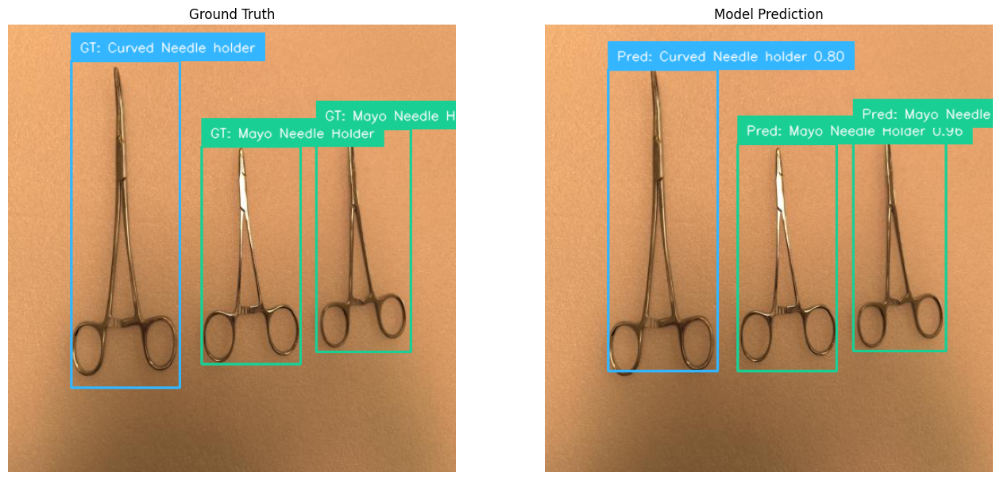

Prediction image: IMG_4271_jpg.rf.4d96b89b345f35c548ebd2d565f2d664.jpg
Score threshold: 0.5
IoU threshold: 0.5

Comparison Summary
------------------
Ground truth objects: 3
Predicted objects: 3
True Positives: 3
False Positives: 0
False Negatives: 0
Precision: 1.0000
Recall:    1.0000


,prediction_class,confidence,best_iou,status
0,Mayo Needle Holder,0.962,0.941,TP
1,Mayo Needle Holder,0.865,0.964,TP
2,Curved Needle holder,0.801,0.909,TP


In [38]:
test_images = (
    list((DATASET_DIR / "test").glob("*.jpg")) +
    list((DATASET_DIR / "test").glob("*.png")) +
    list((DATASET_DIR / "test").glob("*.jpeg"))
)

sample_image_path = random.choice(test_images)

predict_and_compare_with_ground_truth(
    sample_image_path,
    score_threshold=CONFIG["score_threshold"],
    iou_threshold=CONFIG["iou_threshold"]
)

## 13. Save the Trained Model

Save a self-contained checkpoint: weights plus the label maps and config needed to run inference later without re-reading the dataset.

In [ ]:
MODEL_PATH = f"fasterrcnn_{CONFIG['project']}.pth"

torch.save({
    "model_state_dict": model.state_dict(),
    "num_classes": num_classes,
    "class_names": class_names,
    "cat_id_to_contiguous": cat_id_to_contiguous,
    "contiguous_to_name": contiguous_to_name,
    "config": CONFIG,
}, MODEL_PATH)

print("Saved checkpoint to:", MODEL_PATH)
print("Contents: model_state_dict, num_classes, class_names, label maps, config")

## Notes for Better Results

- Increase `num_epochs` in `CONFIG` for better convergence. Five to ten epochs is only a starting point.
- Classes flagged in the Dataset Split Overview as data-limited will score poorly no matter the settings. Add images for those first.
- Review the sample annotations visually before training to catch labeling issues early.
- Tune `score_threshold` for more recall (lower) or fewer false positives (higher).
- For very small objects, export at higher resolution or use tiling in Roboflow. Remember that tiling changes exported box counts.
- The saved checkpoint carries its own label maps, so inference code does not need the dataset to decode predictions.